- This notebook is for testing chemeleon latent space

In [1]:
import sys
sys.path.append("/Users/haoliu/chemprop")
sys.path.append("../src/models")
sys.path.append("../src")
sys.path.append("../")

In [2]:
import os
import chemprop
from chemprop import data, featurizers, models, nn
import torch

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.compose import TransformedTargetRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score

In [4]:
pwd

'/Users/haoliu/Documents/GitHub/FoundationModel_on_Liposome/code/notebooks'

In [ ]:
# Get the data

In [8]:
file_path = '/Users/haoliu/Documents/GitHub/FoundationModel_on_Liposome/data/SurfPro_v1/data/surfpro_literature.csv'
df_data = pd.read_csv(file_path)

df_ = df_data.iloc[:, [0, 1, 3]]
df_cleaned = df_.dropna()
df_data_clean = df_cleaned.reset_index(drop=True)
df_data_clean

,SMILES,Surfactant_Type,pCMC
0,C=CC(=O)OC(C[N+](C)(C)CCCCCCCCCCCC)C[N+](C)(C)...,gemini cationic,3.102373
1,C=CC(=O)OC(C[N+](C)(C)CCCCCCCCCCCCCC)C[N+](C)(...,gemini cationic,3.619789
2,C=CC(=O)OC(C[N+](C)(C)CCCCCCCCCCCCCCCC)C[N+](C...,gemini cationic,4.508638
3,C=CC(=O)OCC[N+](C)(C)CCCCCCCCCCCC.[Br-],cationic,2.384050
4,C=CC(=O)OCC[N+](C)(C)CCCCCCCCCCCCCC.[Br-],cationic,2.899629
...,...,...,...
1390,OCCOCCOCCOCCOCCOCCSCCC(F)(F)C(F)(F)C(F)(F)C(F)...,non-ionic,4.432033
1391,OCCOCCOCCOCCSCCC(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F...,non-ionic,4.552997
1392,OCCOCCOCCSCCC(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F...,non-ionic,4.602060
1393,OCCOCCSCCOCCSCCOCCSCCC(F)(F)C(F)(F)C(F)(F)C(F)...,non-ionic,4.585027


In [11]:
smis = df_data_clean['SMILES']
smis_list = smis.tolist()
smis_list

['C=CC(=O)OC(C[N+](C)(C)CCCCCCCCCCCC)C[N+](C)(C)CCCCCCCCCCCC.[Br-].[Br-]',
 'C=CC(=O)OC(C[N+](C)(C)CCCCCCCCCCCCCC)C[N+](C)(C)CCCCCCCCCCCCCC.[Br-].[Br-]',
 'C=CC(=O)OC(C[N+](C)(C)CCCCCCCCCCCCCCCC)C[N+](C)(C)CCCCCCCCCCCCCCCC.[Br-].[Br-]',
 'C=CC(=O)OCC[N+](C)(C)CCCCCCCCCCCC.[Br-]',
 'C=CC(=O)OCC[N+](C)(C)CCCCCCCCCCCCCC.[Br-]',
 'C=CC(=O)OCC[N+](C)(C)CCCCCCCCCCCCCCCC.[Br-]',
 'CC(C)(C)CC(C)(C)c1ccc(OCCOCCOCCOCCOCCO)cc1',
 'CC(C)(C)CC(C)(C)c1ccc(OCCOCCOCCOCCOCCOCCOCCOCCOCCO)cc1',
 'CC(C)(C)CC(C)(C)c1ccc(OCCOCCOCCOCCOCCOCCOCCOCCOCCOCCO)cc1',
 'CC(C)(C)CC(C)(C)c1ccc(OCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCO)cc1',
 'CC(C)(C)CC(C)(C)c1ccc(OCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCO)cc1',
 'CC(C)(C)CC(C)(C)c1ccc(OCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOCCO)cc1',
 'CC(C)(C)OCCCCCCCCCCCCOS(=O)(=O)[O-].[Na+]',
 'CC(C)(C)[Si]O[Si](C)(CCSCCOCCOCCOCCOCCOCCOCCOCCOCCOCCOC

In [10]:
type(smis)

pandas.core.series.Series

In [7]:
from chemeleon import chemeleon_latent_space

In [13]:
latent_space = chemeleon_latent_space(smis_list)

In [14]:
latent_space.shape

(1395, 2048)

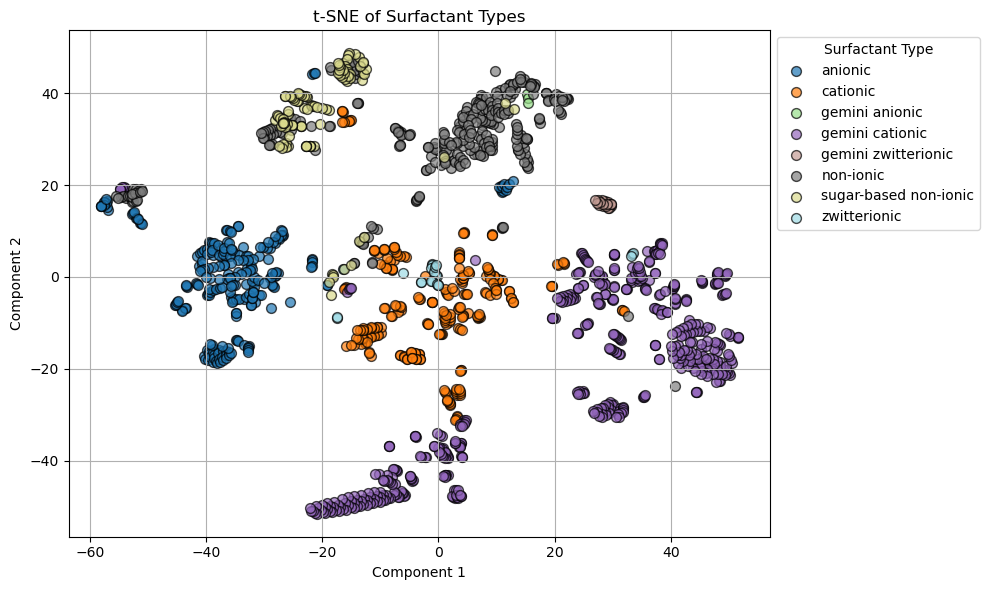

In [16]:
# 1. Prepare input and labels
X = latent_space
y = df_data_clean['Surfactant_Type']

# 2. Create color dictionary
surfactant_types = np.unique(y)
colors = plt.cm.tab20(np.linspace(0, 1, len(surfactant_types)))
color_dict = dict(zip(surfactant_types, colors))

# 3. Choose dimension reduction method
reducer = TSNE(n_components=2, random_state=42)  # or PCA(n_components=2)
X_reduced = reducer.fit_transform(X)

# 4. Plot
plt.figure(figsize=(10,6))
for surfactant in surfactant_types:
    idx = (y == surfactant)
    plt.scatter(X_reduced[idx, 0], X_reduced[idx, 1], 
                color=color_dict[surfactant], 
                label=surfactant, 
                alpha=0.7, edgecolor='k', s=50)

plt.legend(title='Surfactant Type', loc='best', frameon=True, bbox_to_anchor=(1, 1))
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('t-SNE of Surfactant Types')
plt.grid(True)
plt.tight_layout()
plt.show()

In [27]:
latent_space

array([[0.05940257, 0.03247579, 0.00855508, ..., 0.02434037, 0.01462637,
        0.        ],
       [0.05400234, 0.02952344, 0.00777735, ..., 0.02212761, 0.0171757 ,
        0.        ],
       [0.04950215, 0.02706316, 0.00712923, ..., 0.02028364, 0.01574439,
        0.        ],
       ...,
       [0.08039305, 0.00741884, 0.21209149, ..., 0.17600828, 0.12088386,
        0.08581481],
       [0.04028309, 0.01303036, 0.16437091, ..., 0.2101891 , 0.08833316,
        0.06650648],
       [0.03759142, 0.02266149, 0.14293122, ..., 0.24390598, 0.07681144,
        0.05783172]], shape=(1395, 2048), dtype=float32)

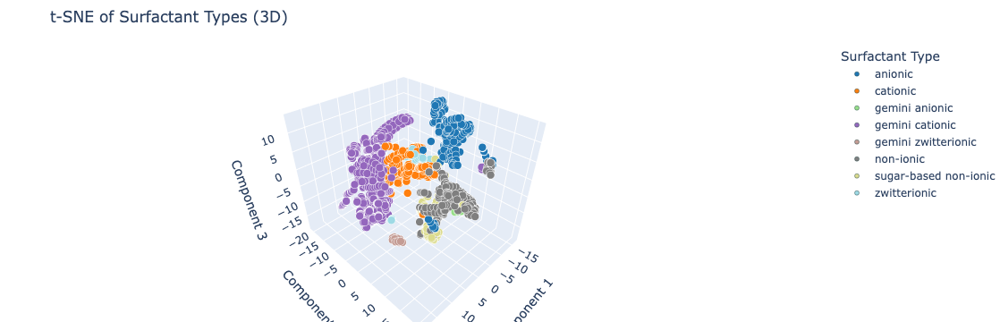

In [17]:
import plotly.graph_objs as go
import plotly.io as pio

# 1. Prepare input and labels (already done)
# X = df_total.iloc[:, :768].values
# y = df_total['Surfactant_Type'].values

# 2. Choose 3D dimension reduction
reducer = TSNE(n_components=3, random_state=42)  # or PCA(n_components=3)
X_reduced = reducer.fit_transform(X)

# 3. Create Plotly traces
traces = []
for surfactant in surfactant_types:
    idx = (y == surfactant)
    trace = go.Scatter3d(
        x=X_reduced[idx, 0],
        y=X_reduced[idx, 1],
        z=X_reduced[idx, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=f'rgb({color_dict[surfactant][0]*255},{color_dict[surfactant][1]*255},{color_dict[surfactant][2]*255})',
            line=dict(width=0.5, color='DarkSlateGrey')
        ),
        name=surfactant
    )
    traces.append(trace)

# 4. Layout
layout = go.Layout(
    title='t-SNE of Surfactant Types (3D)',
    scene=dict(
        xaxis_title='Component 1',
        yaxis_title='Component 2',
        zaxis_title='Component 3'
    ),
    legend=dict(title='Surfactant Type'),
    margin=dict(l=0, r=0, b=0, t=50)
)

fig = go.Figure(data=traces, layout=layout)
pio.show(fig)


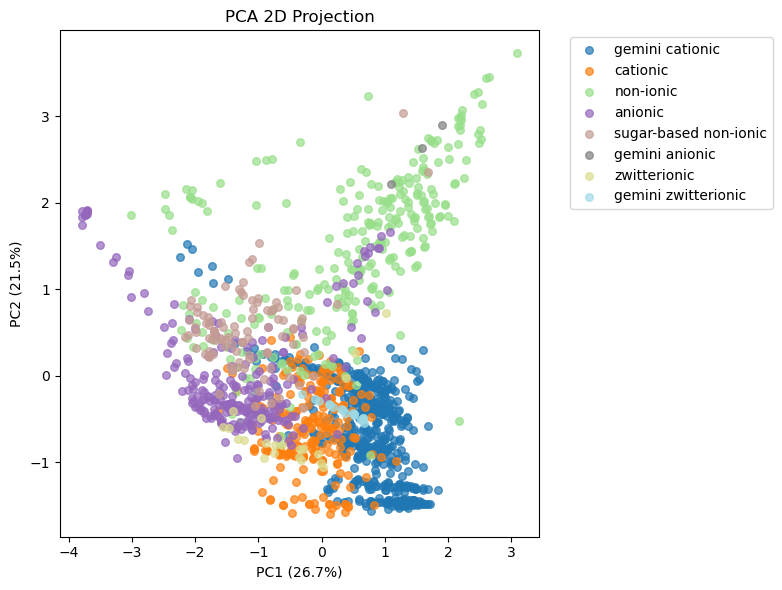

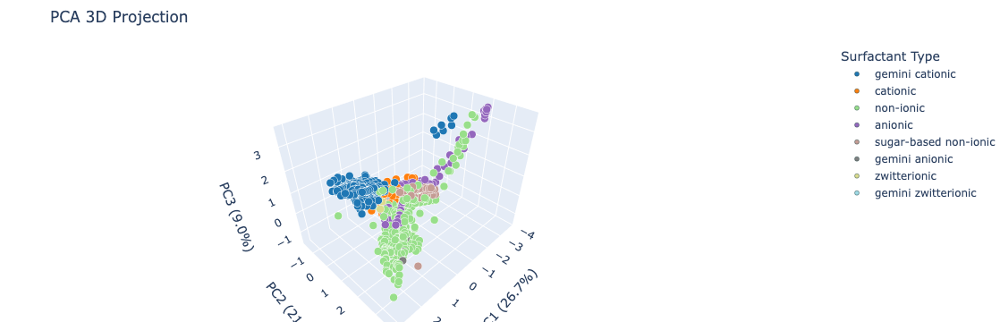

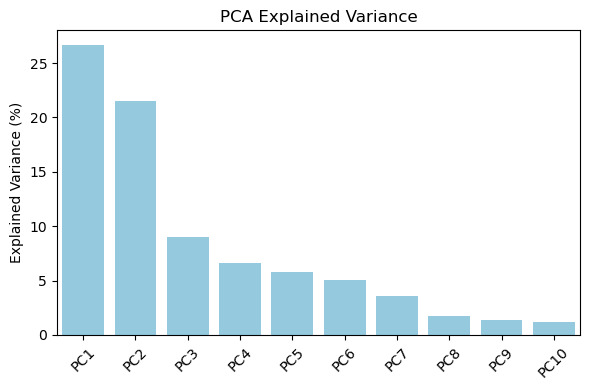

In [18]:
pca = PCA(n_components=10)  # more components to see variance
X_pca = pca.fit_transform(X)

explained_variance = pca.explained_variance_ratio_

# 3. Color mapping
surfactant_types = df_data_clean['Surfactant_Type'].unique()
colors = plt.cm.tab20(np.linspace(0, 1, len(surfactant_types)))
color_dict = dict(zip(surfactant_types, colors))

# 4. 2D Scatter Plot
plt.figure(figsize=(8,6))
for surfactant in surfactant_types:
    idx = (y == surfactant)
    plt.scatter(X_pca[idx, 0], X_pca[idx, 1], 
                color=color_dict[surfactant], 
                label=surfactant, alpha=0.7, s=30)

plt.xlabel(f"PC1 ({explained_variance[0]*100:.1f}%)")
plt.ylabel(f"PC2 ({explained_variance[1]*100:.1f}%)")
plt.title('PCA 2D Projection')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# 5. 3D Interactive Scatter Plot
traces = []
for surfactant in surfactant_types:
    idx = (y == surfactant)
    trace = go.Scatter3d(
        x=X_pca[idx, 0],
        y=X_pca[idx, 1],
        z=X_pca[idx, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=f'rgb({color_dict[surfactant][0]*255},{color_dict[surfactant][1]*255},{color_dict[surfactant][2]*255})',
            line=dict(width=0.5, color='DarkSlateGrey')
        ),
        name=surfactant
    )
    traces.append(trace)

layout = go.Layout(
    title='PCA 3D Projection',
    scene=dict(
        xaxis_title=f'PC1 ({explained_variance[0]*100:.1f}%)',
        yaxis_title=f'PC2 ({explained_variance[1]*100:.1f}%)',
        zaxis_title=f'PC3 ({explained_variance[2]*100:.1f}%)'
    ),
    margin=dict(l=0, r=0, b=0, t=50),
    legend=dict(title='Surfactant Type')
)

fig = go.Figure(data=traces, layout=layout)
pio.show(fig)

# 6. Explained Variance Plot
plt.figure(figsize=(6,4))
sns.barplot(x=[f'PC{i+1}' for i in range(10)], y=explained_variance*100, color='skyblue')
plt.ylabel('Explained Variance (%)')
plt.title('PCA Explained Variance')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [22]:
encodings_df = pd.DataFrame(latent_space) 
df_total = pd.concat([encodings_df, df_data_clean[['Surfactant_Type', 'pCMC']]], axis=1)
df_total

,0,1,2,3,4,5,6,7,8,9,...,2040,2041,2042,2043,2044,2045,2046,2047,Surfactant_Type,pCMC
0,0.059403,0.032476,0.008555,0.000000,0.022349,0.056833,0.0,0.0,0.081806,0.0,...,0.005357,0.042994,0.0,0.032956,0.454636,0.024340,0.014626,0.000000,gemini cationic,3.102373
1,0.054002,0.029523,0.007777,0.000000,0.020317,0.072615,0.0,0.0,0.074369,0.0,...,0.004870,0.039085,0.0,0.029960,0.466892,0.022128,0.017176,0.000000,gemini cationic,3.619789
2,0.049502,0.027063,0.007129,0.000000,0.018624,0.066564,0.0,0.0,0.068172,0.0,...,0.004464,0.035828,0.0,0.027463,0.467353,0.020284,0.015744,0.000000,gemini cationic,4.508638
3,0.134067,0.021601,0.000000,0.000000,0.000000,0.018929,0.0,0.0,0.056469,0.0,...,0.004658,0.018951,0.0,0.030863,0.202785,0.124004,0.058441,0.000000,cationic,2.384050
4,0.123342,0.019873,0.000000,0.000000,0.000000,0.035850,0.0,0.0,0.051951,0.0,...,0.004285,0.017435,0.0,0.028394,0.233718,0.114084,0.057180,0.000000,cationic,2.899629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1390,0.074241,0.000000,0.164371,0.025905,0.040439,0.015933,0.0,0.0,0.001121,0.0,...,0.000000,0.468085,0.0,0.064018,0.088886,0.336875,0.091744,0.066506,non-ionic,4.432033
1391,0.081907,0.000000,0.193378,0.030476,0.028268,0.018745,0.0,0.0,0.000000,0.0,...,0.000000,0.488152,0.0,0.075315,0.104572,0.239093,0.111998,0.078243,non-ionic,4.552997
1392,0.080393,0.007419,0.212091,0.033426,0.023936,0.020559,0.0,0.0,0.000000,0.0,...,0.000000,0.501098,0.0,0.083662,0.105045,0.176008,0.120884,0.085815,non-ionic,4.602060
1393,0.040283,0.013030,0.164371,0.025905,0.016487,0.029940,0.0,0.0,0.043743,0.0,...,0.000000,0.409013,0.0,0.064363,0.114305,0.210189,0.088333,0.066506,non-ionic,4.585027


RMSE score : 0.5052037072124489
R2 score : 0.769720677466681


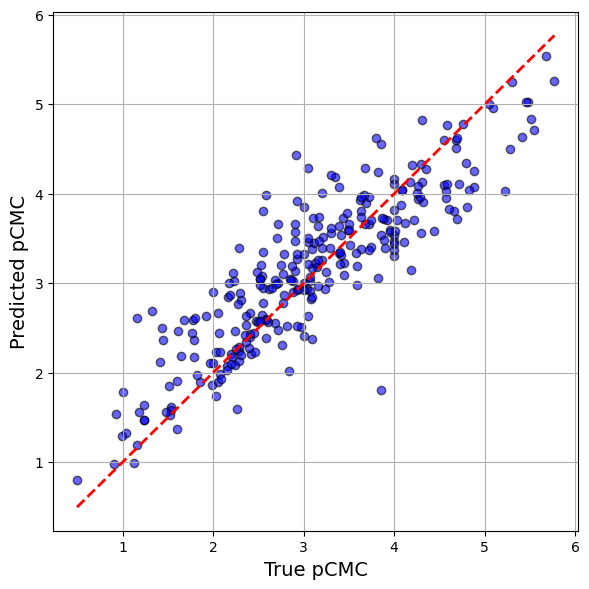

In [24]:
property_='pCMC'
train_df, test_df = train_test_split(
        df_total,
        test_size=0.2, 
        stratify=df_total['Surfactant_Type'],
        random_state=42  # for reproducibility
    )

train_x = train_df.iloc[:,0:300]
train_y = train_df[property_]

test_x = test_df.iloc[:,0:300]
test_y = test_df[property_]

# regressor = SVR(kernel="rbf", degree=3, C=5, gamma="scale", epsilon=0.01)
regressor = RandomForestRegressor(n_estimators=100, random_state=42)
model = TransformedTargetRegressor(regressor=regressor,
                                transformer=MinMaxScaler(feature_range=(-1, 1))
                                ).fit(train_x, train_y)

pred_y = model.predict(test_x)
RMSE_score = np.sqrt(mean_squared_error(test_y, pred_y))
r2 = r2_score(test_y, pred_y)

print(f"RMSE score : {RMSE_score}" )
print(f"R2 score : {r2}" )

# Scatter plot: True vs Predicted
plt.figure(figsize=(6, 6))
plt.scatter(test_y, pred_y, color='blue', alpha=0.6, edgecolor='k')
plt.plot([test_y.min(), test_y.max()], [test_y.min(), test_y.max()], 'r--', lw=2)  # y = x line
plt.xlabel(f'True {property_}', fontsize=14)
plt.ylabel(f'Predicted {property_}', fontsize=14)
# plt.title('SVR Prediction vs True Values', fontsize=16)
plt.grid(True)
plt.tight_layout()

# plot_path = os.path.join(save_dir, f'prediction_{property}_{time_str}.png')
# plt.savefig(plot_path, dpi=300)
# fig.savefig(plot_path, dpi=300, bbox_inches='tight')
plt.show()
# plt.close()

In [30]:
df_total.to_csv('df_total_surfactants_chemeleon_20250707.csv', index=False)